# Работу выполнил: Кузнецов Артём Андреевич 3825М1сФИ1

# Основное задание
1. Загрузите изображение в оттенках серого sar_1_gray.jpg
2. Постройте гистограмму
3. Реализуйте алгоритм гамма коррекции с параметром гамма <1, >1
4. Сравните исходное изображение, скорректированное при помощи гамма-фильтра. MSE, SSIM
5. Реализуйте алгоритм статистической цветокоррекции на основе статистики eq_gray
6. Протестируйте работу алгоритмов пороговой фильтрации с различными параметрами

# Доп задание
Реализовать алгоритм, который выводит 1, если математическое ожидание и стандартное отклонение двух изображений отличаются не более чем на заданные пороги, и 0 в противном случае.

# Построение гистограммы

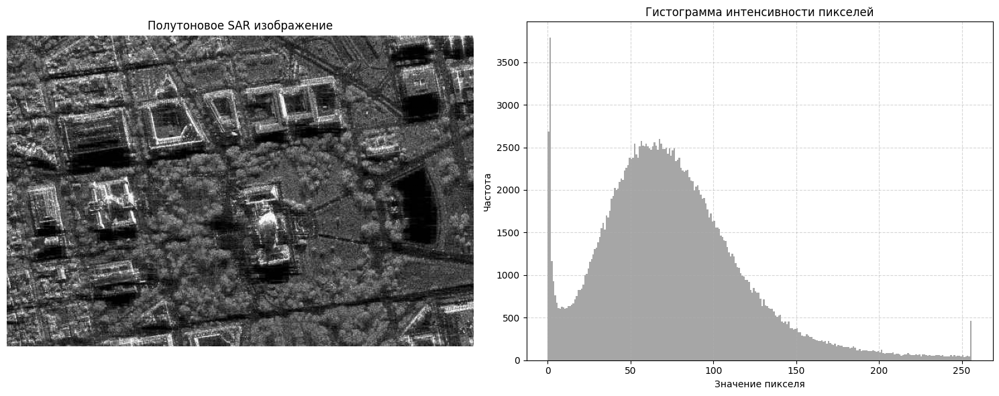

In [12]:
import cv2
import matplotlib.pyplot as plt
import numpy as np

img_path = 'sar_1_gray.jpg'
image = cv2.imread(img_path, cv2.IMREAD_GRAYSCALE)

if image is None:
    print(f'Ошибка: Не удалось загрузить изображение по пути {img_path}')
else:
    fig, ax = plt.subplots(1, 2, figsize=(15, 6))

    ax[0].imshow(image, cmap='gray')
    ax[0].set_title('Полутоновое SAR изображение')
    ax[0].axis('off')

    ax[1].hist(image.ravel(), bins=256, range=[0, 256], color='gray', alpha=0.7)
    ax[1].set_title('Гистограмма интенсивности пикселей')
    ax[1].set_xlabel('Значение пикселя')
    ax[1].set_ylabel('Частота')
    ax[1].grid(True, linestyle='--', alpha=0.5)

    plt.tight_layout()
    plt.show()

## Гамма коррекция

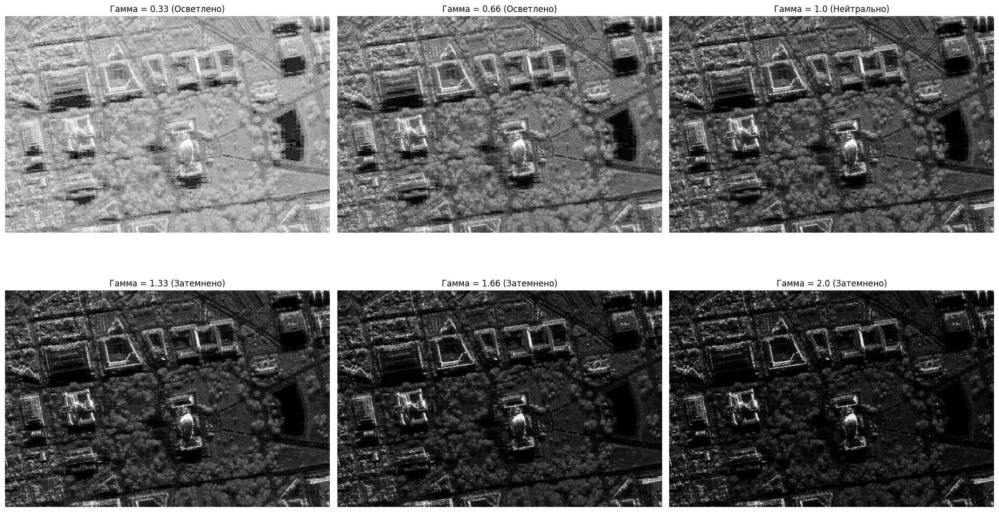

In [13]:
def apply_gamma_correction(img, gamma):
    table = np.array([((i / 255.0) ** gamma) * 255
                      for i in np.arange(0, 256)]).astype("uint8")
    return cv2.LUT(img, table)

gamma_values = [0.33, 0.66, 1.0, 1.33, 1.66, 2.0]
corrected_images = []

for g in gamma_values:
    corrected_images.append(apply_gamma_correction(image, g))

fig, axes = plt.subplots(2, 3, figsize=(20, 12))
axes = axes.ravel()

for i, (img_corr, g) in enumerate(zip(corrected_images, gamma_values)):
    axes[i].imshow(img_corr, cmap='gray')
    label = "Нейтрально" if g == 1.0 else ("Осветлено" if g < 1.0 else "Затемнено")
    axes[i].set_title(f'Гамма = {g} ({label})')
    axes[i].axis('off')

plt.tight_layout()
plt.show()

# MSE SSIM

In [14]:
from skimage.metrics import structural_similarity as ssim

def calculate_mse(img1, img2):
    return np.mean((img1.astype("float") - img2.astype("float")) ** 2)

print('Полный отчет по метрикам качества для всех значений Гаммы:\n')

for i, g in enumerate(gamma_values):
    current_img = corrected_images[i]
    mse_val = calculate_mse(image, current_img)
    ssim_val = ssim(image, current_img, data_range=255)

    label = "Оригинал" if g == 1.0 else ("Осветление" if g < 1.0 else "Затемнение")
    print(f'Гамма = {g} ({label}):')
    print(f'  MSE: {mse_val:.2f}')
    print(f'  SSIM: {ssim_val:.4f}\n')

Полный отчет по метрикам качества для всех значений Гаммы:

Гамма = 0.33 (Осветление):
  MSE: 7750.43
  SSIM: 0.6517

Гамма = 0.66 (Осветление):
  MSE: 1172.80
  SSIM: 0.8902

Гамма = 1.0 (Оригинал):
  MSE: 0.00
  SSIM: 1.0000

Гамма = 1.33 (Затемнение):
  MSE: 514.06
  SSIM: 0.8999

Гамма = 1.66 (Затемнение):
  MSE: 1434.83
  SSIM: 0.7121

Гамма = 2.0 (Затемнение):
  MSE: 2383.76
  SSIM: 0.5270



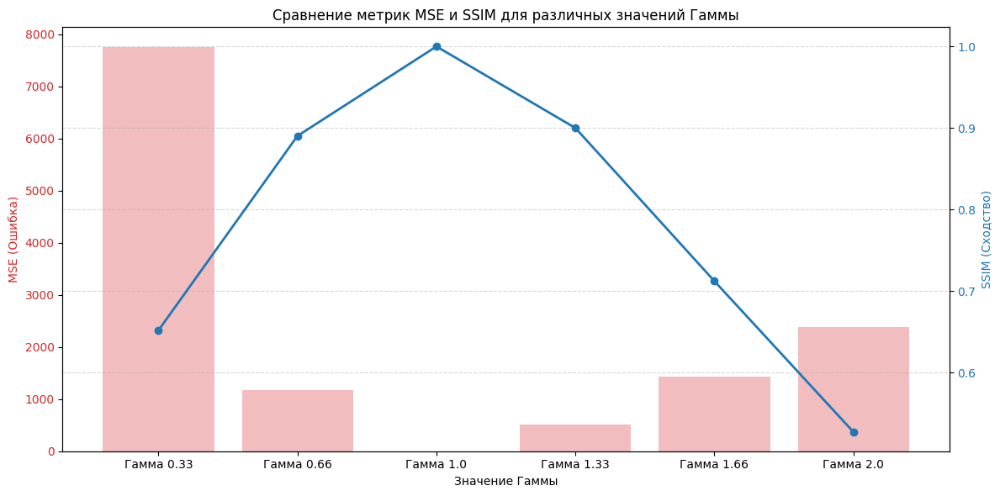

In [15]:
import matplotlib.pyplot as plt

labels = [f'Гамма {g}' for g in gamma_values]
mse_values = [calculate_mse(image, img) for img in corrected_images]
ssim_values = [ssim(image, img, data_range=255) for img in corrected_images]

fig, ax1 = plt.subplots(figsize=(12, 6))

# График MSE (левая ось)
color = 'tab:red'
ax1.set_xlabel('Значение Гаммы')
ax1.set_ylabel('MSE (Ошибка)', color=color)
ax1.bar(labels, mse_values, color=color, alpha=0.3, label='MSE')
ax1.tick_params(axis='y', labelcolor=color)

# График SSIM (правая ось)
ax2 = ax1.twinx()
color = 'tab:blue'
ax2.set_ylabel('SSIM (Сходство)', color=color)
ax2.plot(labels, ssim_values, color=color, marker='o', linewidth=2, label='SSIM')
ax2.tick_params(axis='y', labelcolor=color)

plt.title('Сравнение метрик MSE и SSIM для различных значений Гаммы')
fig.tight_layout()
plt.grid(True, axis='y', linestyle='--', alpha=0.5)
plt.show()

## Статистическая цветокоррекция


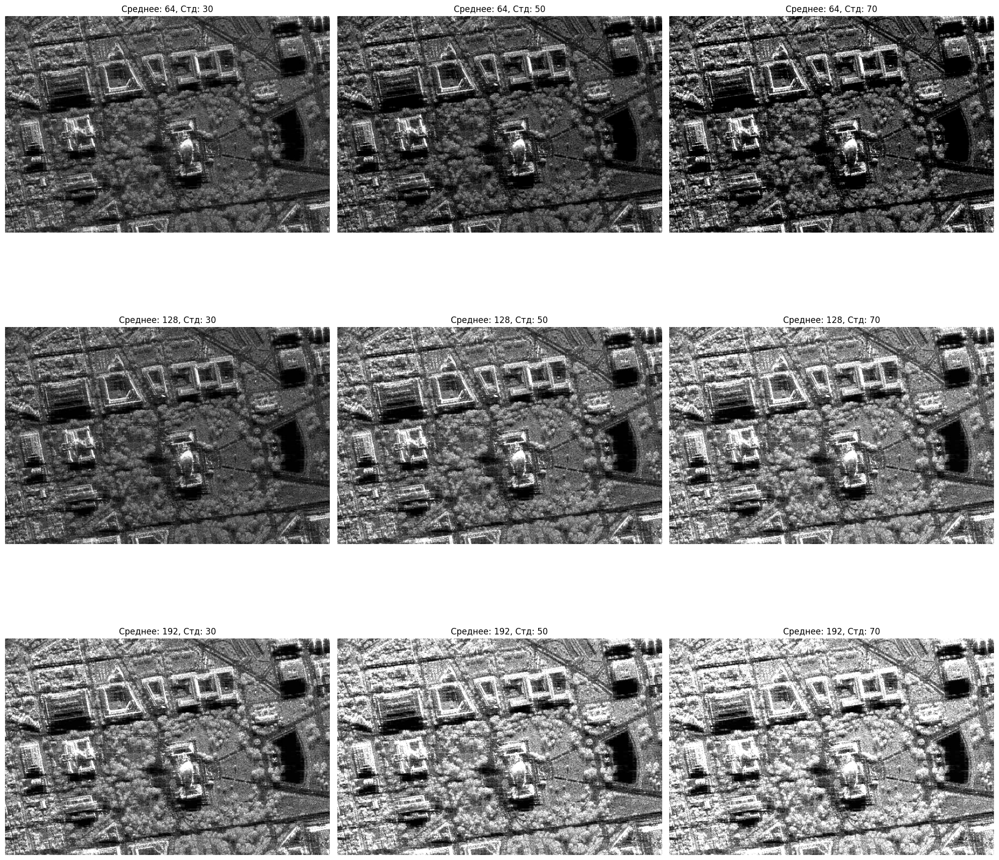

In [16]:
current_mean = np.mean(image)
current_std = np.std(image)

# Набор целевых параметров (Среднее, Стандартное отклонение)
targets = [
    (64, 30), (64, 50), (64, 70),
    (128, 30), (128, 50), (128, 70),
    (192, 30), (192, 50), (192, 70)
]

fig, axes = plt.subplots(3, 3, figsize=(20, 20))
axes = axes.ravel()

for i, (t_mean, t_std) in enumerate(targets):
    img_corrected = ((image.astype('float32') - current_mean) * (t_std / current_std)) + t_mean
    img_corrected = np.clip(img_corrected, 0, 255).astype('uint8')

    axes[i].imshow(img_corrected, cmap='gray')
    axes[i].set_title(f'Среднее: {t_mean}, Стд: {t_std}')
    axes[i].axis('off')

plt.tight_layout()
plt.show()

# Алгоритмы пороговой фильтрации с разными параметрами

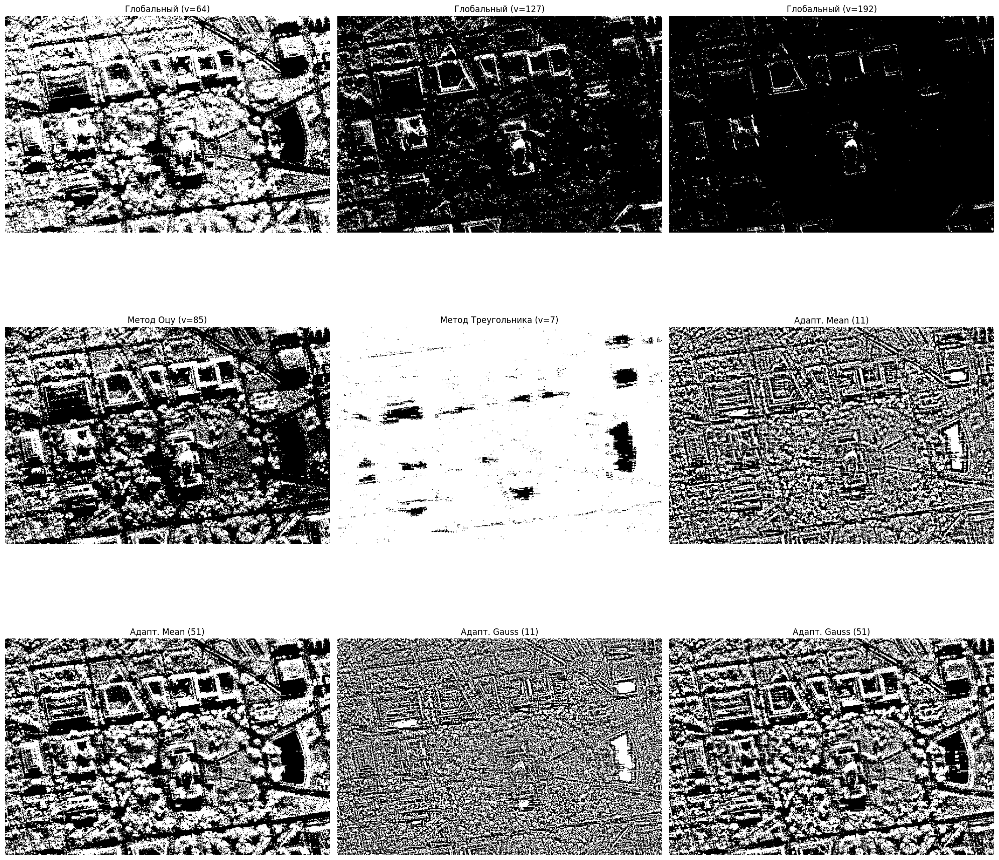

In [17]:
# 1. Глобальный порог (v=64)
ret1, th1 = cv2.threshold(image, 64, 255, cv2.THRESH_BINARY)

# 2. Глобальный порог (v=127)
ret2, th2 = cv2.threshold(image, 127, 255, cv2.THRESH_BINARY)

# 3. Глобальный порог (v=192)
ret3, th3 = cv2.threshold(image, 192, 255, cv2.THRESH_BINARY)

# 4. Метод Оцу (Автоматический)
ret_otsu, th_otsu = cv2.threshold(image, 0, 255, cv2.THRESH_BINARY + cv2.THRESH_OTSU)

# 5. Метод Треугольника (Автоматический)
ret_tri, th_tri = cv2.threshold(image, 0, 255, cv2.THRESH_BINARY + cv2.THRESH_TRIANGLE)

# 6. Адаптивный порог (Mean, блок 11)
th_ad_m11 = cv2.adaptiveThreshold(image, 255, cv2.ADAPTIVE_THRESH_MEAN_C, cv2.THRESH_BINARY, 11, 2)

# 7. Адаптивный порог (Mean, блок 51)
th_ad_m51 = cv2.adaptiveThreshold(image, 255, cv2.ADAPTIVE_THRESH_MEAN_C, cv2.THRESH_BINARY, 51, 2)

# 8. Адаптивный порог (Gaussian, блок 11)
th_ad_g11 = cv2.adaptiveThreshold(image, 255, cv2.ADAPTIVE_THRESH_GAUSSIAN_C, cv2.THRESH_BINARY, 11, 2)

# 9. Адаптивный порог (Gaussian, блок 51)
th_ad_g51 = cv2.adaptiveThreshold(image, 255, cv2.ADAPTIVE_THRESH_GAUSSIAN_C, cv2.THRESH_BINARY, 51, 2)

# Визуализация 9 результатов
fig, axes = plt.subplots(3, 3, figsize=(20, 20))
axes = axes.ravel()

titles = [
    'Глобальный (v=64)', 'Глобальный (v=127)', 'Глобальный (v=192)',
    f'Метод Оцу (v={int(ret_otsu)})', f'Метод Треугольника (v={int(ret_tri)})',
    'Адапт. Mean (11)', 'Адапт. Mean (51)',
    'Адапт. Gauss (11)', 'Адапт. Gauss (51)'
]
images = [th1, th2, th3, th_otsu, th_tri, th_ad_m11, th_ad_m51, th_ad_g11, th_ad_g51]

for i in range(9):
    axes[i].imshow(images[i], cmap='gray')
    axes[i].set_title(titles[i])
    axes[i].axis('off')

plt.tight_layout()
plt.show()

# Дополнительное задание

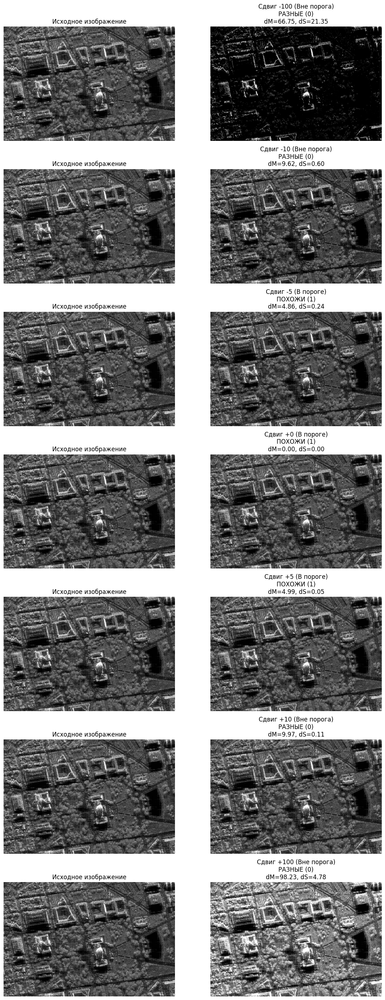

In [18]:
def compare_images_stat(img1, img2, diff_mean=1.0, diff_std=1.0):
    """
    Сравнивает два изображения.
    Возвращает 1, если разница средних <= diff_mean И разница стд. отклонений <= diff_std.
    Иначе возвращает 0.
    """
    m1, s1 = np.mean(img1), np.std(img1)
    m2, s2 = np.mean(img2), np.std(img2)

    mean_diff = abs(m1 - m2)
    std_diff = abs(s1 - s2)

    result = 1 if (mean_diff <= diff_mean and std_diff <= diff_std) else 0

    return result, mean_diff, std_diff

# Набор сдвигов
shifts = [-100, -10, -5, 0, 5, 10, 100]
test_cases = []

for s in shifts:
    label = f"Сдвиг {s:+} ({'В пороге' if abs(s) <= 5 else 'Вне порога'})"
    shifted_img = np.clip(image.astype(float) + s, 0, 255).astype(np.uint8)
    test_cases.append((label, image, shifted_img))

fig, axes = plt.subplots(len(test_cases), 2, figsize=(12, 4 * len(test_cases)))

D_MEAN = 5.1
D_STD = 2.0

for i, (title, img1, img2) in enumerate(test_cases):
    res, dm, ds = compare_images_stat(img1, img2, diff_mean=D_MEAN, diff_std=D_STD)

    axes[i, 0].imshow(img1, cmap='gray')
    axes[i, 0].set_title("Исходное изображение")
    axes[i, 0].axis('off')

    axes[i, 1].imshow(img2, cmap='gray')
    status = "ПОХОЖИ (1)" if res == 1 else "РАЗНЫЕ (0)"
    axes[i, 1].set_title(f"{title}\n{status}\ndM={dm:.2f}, dS={ds:.2f}")
    axes[i, 1].axis('off')

plt.tight_layout()
plt.show()